In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

In [64]:
pd.set_option('display.max_columns', None)

In [62]:
data = pd.read_csv('presidents_data.csv')

In [65]:
data.head()

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq
0,1,George Washington,188,74.0,79.4,175,22.5,Normal,22,2,1732,22-02-1732,Westmoreland County,Virginia,14.0,12.0,1799.0,14-12-1799,67.0,Pisces,30,4,1789,30-04-1789,4.0,3.0,1797.0,04-03-1797,57,65.0,Unaffiliated,140.0
1,2,John Adams,170,67.0,83.9,185,29.0,Overweight,30,10,1735,30-10-1735,Braintree,Massachusetts,4.0,7.0,1826.0,04-07-1826,90.0,Scorpio,4,3,1797,04-03-1797,4.0,3.0,1801.0,04-03-1801,61,65.0,Federalist,155.0
2,3,Thomas Jefferson,189,74.5,82.1,181,23.0,Normal,13,4,1743,13-04-1743,Shadwell,Virginia,4.0,7.0,1826.0,04-07-1826,83.0,Aries,4,3,1801,04-03-1801,4.0,3.0,1809.0,04-03-1809,57,65.0,Democratic-Republican,160.0
3,4,James Madison,163,64.0,55.3,122,20.8,Normal,16,3,1751,16-03-1751,Port Conway,Virginia,28.0,6.0,1836.0,28-06-1836,85.0,Pisces,4,3,1809,04-03-1809,4.0,3.0,1817.0,04-03-1817,57,65.0,Democratic-Republican,160.0
4,5,James Monroe,183,72.0,85.7,189,25.6,Overweight,28,4,1758,28-04-1758,Monroe Hall,Virginia,4.0,7.0,1831.0,04-07-1831,73.0,Taurus,4,3,1817,04-03-1817,4.0,3.0,1825.0,04-03-1825,58,66.0,Democratic-Republican,139.0


In [50]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order                  45 non-null     object 
 1   name                   45 non-null     object 
 2   height_cm              45 non-null     int64  
 3   height_in              45 non-null     float64
 4   weight_kg              45 non-null     float64
 5   weight_lb              45 non-null     int64  
 6   body_mass_index        45 non-null     float64
 7   body_mass_index_range  45 non-null     object 
 8   birth_day              45 non-null     int64  
 9   birth_month            45 non-null     int64  
 10  birth_year             45 non-null     int64  
 11  birth_date             45 non-null     object 
 12  birthplace             45 non-null     object 
 13  birth_state            45 non-null     object 
 14  death_day              39 non-null     float64
 15  death_mo

In [51]:
profile = ProfileReport(data,title='Profile report')

In [52]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

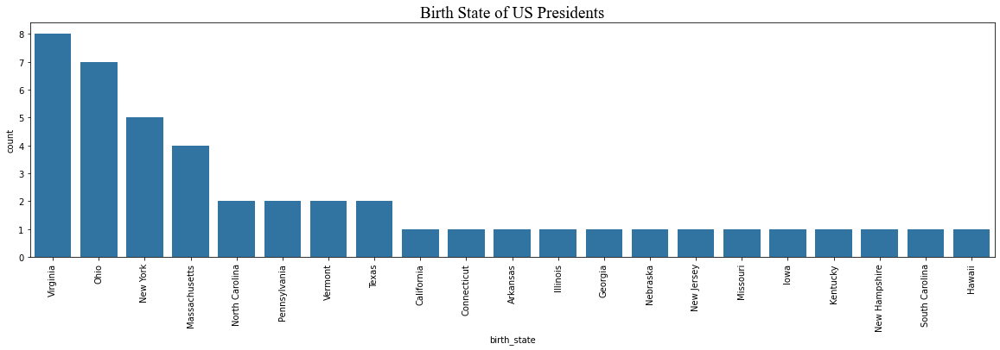

In [54]:
plt.figure(figsize=[20,5])
base_color=sns.color_palette()[0]
order=data['birth_state'].value_counts().index
sns.countplot(data=data,x='birth_state',order=order,color=base_color)
plt.title('Birth State of US Presidents',fontsize=19,fontname='Times new roman')
plt.xticks(rotation=90);

most presidents was born in Virgina

In [55]:
data.columns

Index(['order', 'name', 'height_cm', 'height_in', 'weight_kg', 'weight_lb',
       'body_mass_index', 'body_mass_index_range', 'birth_day', 'birth_month',
       'birth_year', 'birth_date', 'birthplace', 'birth_state', 'death_day',
       'death_month', 'death_year', 'death_date', 'death_age',
       'astrological_sign', 'term_begin_day', 'term_begin_month',
       'term_begin_year', 'term_begin_date', 'term_end_day', 'term_end_month',
       'term_end_year', 'term_end_date', 'presidency_begin_age',
       'presidency_end_age', 'political_party', 'corrected_iq'],
      dtype='object')

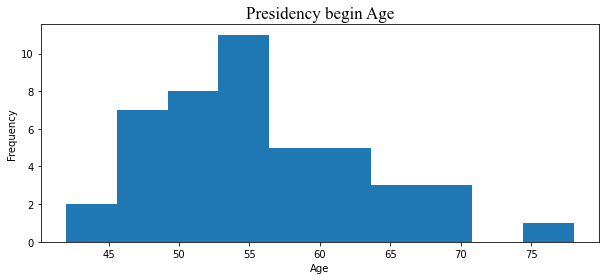

In [70]:
plt.figure(figsize=[10,4])
plt.hist(data['presidency_begin_age']);
plt.title('Presidency begin Age',fontname='Times new roman',fontsize=17);
plt.ylabel('Frequency');
plt.xlabel('Age');

most of presidents started when they have around 55 years old

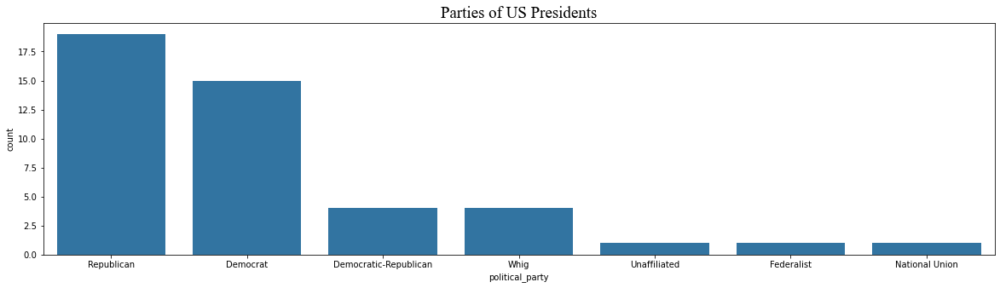

In [71]:
plt.figure(figsize=[20,5])
base_color=sns.color_palette()[0]
order=data['political_party'].value_counts().index
sns.countplot(data=data,x='political_party',order=order,color=base_color);
plt.title('Parties of US Presidents',fontsize=19,fontname='Times new roman');

most presidents come from republican party

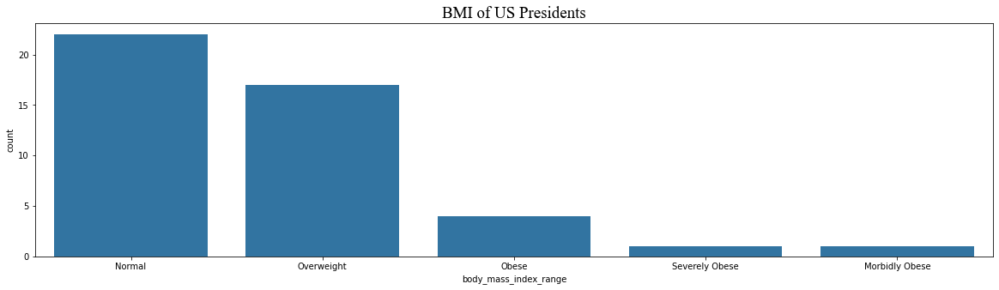

In [72]:
plt.figure(figsize=[20,5])
base_color=sns.color_palette()[0]
order=data['body_mass_index_range'].value_counts().index
sns.countplot(data=data,x='body_mass_index_range',order=order,color=base_color);
plt.title('BMI of US Presidents',fontsize=19,fontname='Times new roman');

most of the presidents have normal BMI

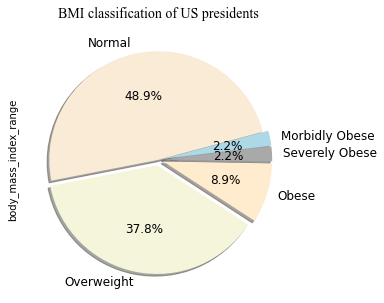

In [74]:
plt.figure(figsize=[20,5])
my_colors=['AntiqueWhite','Beige','BlanchedAlmond','DarkGray','LightBlue']
my_explode = (0, 0.05, 0.05,0.05,0.05)
data['body_mass_index_range'].value_counts(normalize=True).plot(kind='pie',
                                                           fontsize=12,autopct='%1.1f%%', startangle=15, shadow = True
                                                           ,colors=my_colors,explode=my_explode)
plt.title('BMI classification of US presidents',fontname='Times new roman',fontsize=14);

around half of the presidents had normal BMI but nearly 38% are overwighted

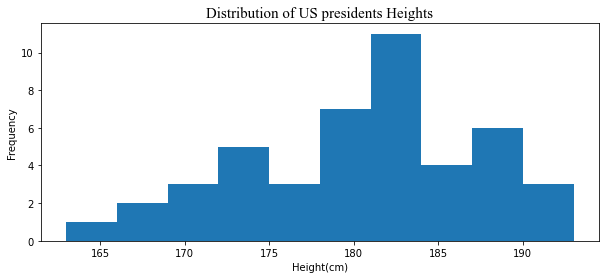

In [75]:
plt.figure(figsize=[10,4])
plt.hist(data['height_cm']);
plt.title('Distribution of US presidents Heights',fontname='Times new roman',fontsize=15);
plt.xlabel('Height(cm)')
plt.ylabel('Frequency');

most of the presidents are in the height range 180 - 185 which is six feet

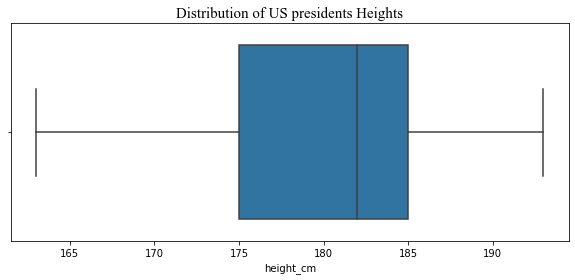

In [76]:
plt.figure(figsize=[10,4])
sns.boxplot(data=data,x='height_cm');
plt.title('Distribution of US presidents Heights',fontname='Times new roman',fontsize=15);

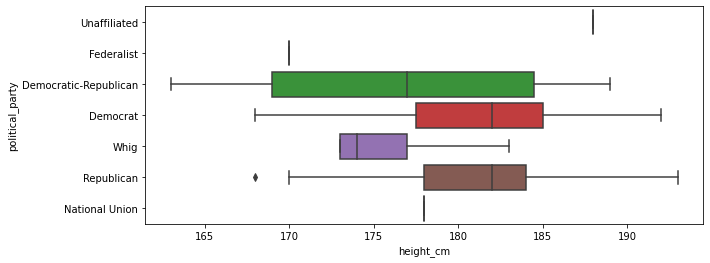

In [77]:
plt.figure(figsize=[10,4])
sns.boxplot(data=data,x='height_cm',y='political_party');

In [78]:
display(data.nlargest(1,'height_cm'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq
15,16,Abraham Lincoln,193,76.0,83.9,185,22.5,Normal,12,2,1809,12-02-1809,Sinking Spring,Kentucky,15.0,4.0,1865.0,15-04-1865,56.0,Aquarius,4,3,1861,04-03-1861,15.0,4.0,1865.0,15-04-1865,52,56.0,Republican,150.0


Abraham Lincoln was the tallest president

In [80]:
display(data.nsmallest(1,'height_cm'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq
3,4,James Madison,163,64.0,55.3,122,20.8,Normal,16,3,1751,16-03-1751,Port Conway,Virginia,28.0,6.0,1836.0,28-06-1836,85.0,Pisces,4,3,1809,04-03-1809,4.0,3.0,1817.0,04-03-1817,57,65.0,Democratic-Republican,160.0


shortest was James Madison

In [82]:
display(data.nsmallest(1,'body_mass_index'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq
6,7,Andrew Jackson,185,73.0,63.5,140,18.6,Normal,15,3,1767,15-03-1767,Waxhaws Region,South Carolina,8.0,6.0,1845.0,08-06-1845,78.0,Pisces,4,3,1829,04-03-1829,4.0,3.0,1837.0,04-03-1837,61,69.0,Democrat,145.0


Andrew Jackson have the least BMI

In [83]:
display(data.nlargest(1,'body_mass_index'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq
25,27,William Howard Taft,182,71.5,154.2,340,46.6,Morbidly Obese,15,9,1857,15-09-1857,Cincinnati,Ohio,8.0,3.0,1930.0,08-03-1930,72.0,Virgo,4,3,1909,04-03-1909,4.0,3.0,1913.0,04-03-1913,51,55.0,Republican,140.0


William Howard Taft had the heighst BMI

In [84]:
data.columns

Index(['order', 'name', 'height_cm', 'height_in', 'weight_kg', 'weight_lb',
       'body_mass_index', 'body_mass_index_range', 'birth_day', 'birth_month',
       'birth_year', 'birth_date', 'birthplace', 'birth_state', 'death_day',
       'death_month', 'death_year', 'death_date', 'death_age',
       'astrological_sign', 'term_begin_day', 'term_begin_month',
       'term_begin_year', 'term_begin_date', 'term_end_day', 'term_end_month',
       'term_end_year', 'term_end_date', 'presidency_begin_age',
       'presidency_end_age', 'political_party', 'corrected_iq'],
      dtype='object')

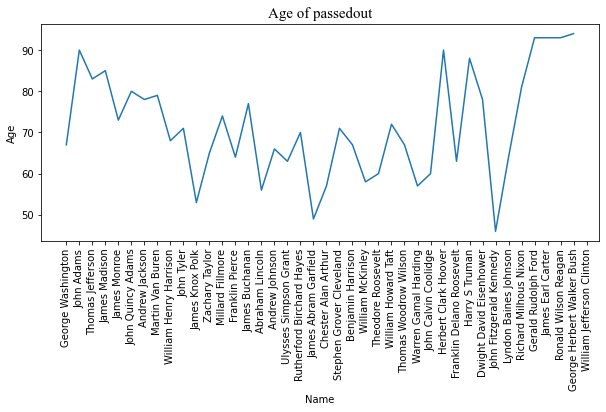

In [92]:
plt.figure(figsize=[10,4])
sns.lineplot(data=data,x='name',y='death_age')
plt.title('Age of passedout',fontname='Times new roman',fontsize=15)
plt.xticks(rotation=90)
plt.xlabel('Name')
plt.ylabel('Age');

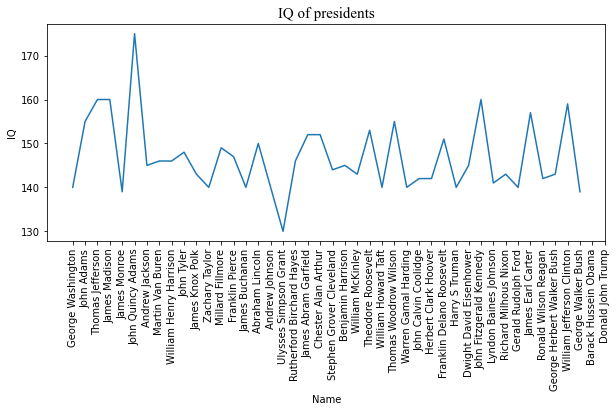

In [91]:
plt.figure(figsize=[10,4])
sns.lineplot(data=data,x='name',y='corrected_iq')
plt.title('IQ of presidents',fontname='Times new roman',fontsize=15)
plt.xticks(rotation=90)
plt.xlabel('Name')
plt.ylabel('IQ');

In [98]:
df = data[['term_begin_date','term_end_date']]

In [99]:
df.head()

,term_begin_date,term_end_date
0,30-04-1789,04-03-1797
1,04-03-1797,04-03-1801
2,04-03-1801,04-03-1809
3,04-03-1809,04-03-1817
4,04-03-1817,04-03-1825


In [100]:
df=df.apply(pd.to_datetime,errors='coerce')

In [114]:
df["term_end_date"] = pd.to_datetime(df["term_end_date"])
df["term_begin_date"] = pd.to_datetime(df["term_begin_date"])

df["days"] = (df["term_end_date"] - df["term_begin_date"])/np.timedelta64(1, 'D')

In [118]:
df.head()

,term_begin_date,term_end_date,days
0,1789-04-30,1797-04-03,2895.0
1,1797-04-03,1801-04-03,1460.0
2,1801-04-03,1809-04-03,2922.0
3,1809-04-03,1817-04-03,2922.0
4,1817-04-03,1825-04-03,2922.0


In [119]:
df1=df['days']

In [120]:
data=pd.concat([data,df1],axis=1,join='inner')

In [121]:
data.head()

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq,days
0,1,George Washington,188,74.0,79.4,175,22.5,Normal,22,2,1732,22-02-1732,Westmoreland County,Virginia,14.0,12.0,1799.0,14-12-1799,67.0,Pisces,30,4,1789,30-04-1789,4.0,3.0,1797.0,04-03-1797,57,65.0,Unaffiliated,140.0,2895.0
1,2,John Adams,170,67.0,83.9,185,29.0,Overweight,30,10,1735,30-10-1735,Braintree,Massachusetts,4.0,7.0,1826.0,04-07-1826,90.0,Scorpio,4,3,1797,04-03-1797,4.0,3.0,1801.0,04-03-1801,61,65.0,Federalist,155.0,1460.0
2,3,Thomas Jefferson,189,74.5,82.1,181,23.0,Normal,13,4,1743,13-04-1743,Shadwell,Virginia,4.0,7.0,1826.0,04-07-1826,83.0,Aries,4,3,1801,04-03-1801,4.0,3.0,1809.0,04-03-1809,57,65.0,Democratic-Republican,160.0,2922.0
3,4,James Madison,163,64.0,55.3,122,20.8,Normal,16,3,1751,16-03-1751,Port Conway,Virginia,28.0,6.0,1836.0,28-06-1836,85.0,Pisces,4,3,1809,04-03-1809,4.0,3.0,1817.0,04-03-1817,57,65.0,Democratic-Republican,160.0,2922.0
4,5,James Monroe,183,72.0,85.7,189,25.6,Overweight,28,4,1758,28-04-1758,Monroe Hall,Virginia,4.0,7.0,1831.0,04-07-1831,73.0,Taurus,4,3,1817,04-03-1817,4.0,3.0,1825.0,04-03-1825,58,66.0,Democratic-Republican,139.0,2922.0


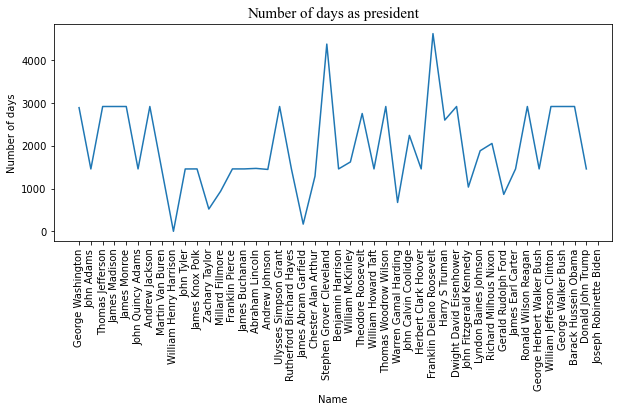

In [122]:
plt.figure(figsize=[10,4])
sns.lineplot(data=data,x='name',y='days')
plt.title('Number of days as president',fontname='Times new roman',fontsize=15)
plt.xticks(rotation=90)
plt.xlabel('Name')
plt.ylabel('Number of days');

In [126]:
display(data.nlargest(2,'days'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq,days
30,32,Franklin Delano Roosevelt,188,74.0,86.2,190,24.4,Normal,30,1,1882,30-01-1882,Hyde Park,New York,12.0,4.0,1945.0,12-04-1945,63.0,Aquarius,4,3,1933,04-03-1933,12.0,4.0,1945.0,12-04-1945,51,63.0,Democrat,151.0,4628.0
21,22 & 24,Stephen Grover Cleveland,180,71.0,117.9,260,36.4,Severely Obese,18,3,1837,18-03-1837,Caldwell,New Jersey,24.0,6.0,1908.0,24-06-1908,71.0,Pisces,4,3,1885,04-03-1885,4.0,3.0,1897.0,04-03-1897,47,59.0,Democrat,144.0,4383.0


Franklin Delano Roosevelt has the highest number of days as president(4628 days)

In [125]:
display(data.nsmallest(2,'days'))

,order,name,height_cm,height_in,weight_kg,weight_lb,body_mass_index,body_mass_index_range,birth_day,birth_month,birth_year,birth_date,birthplace,birth_state,death_day,death_month,death_year,death_date,death_age,astrological_sign,term_begin_day,term_begin_month,term_begin_year,term_begin_date,term_end_day,term_end_month,term_end_year,term_end_date,presidency_begin_age,presidency_end_age,political_party,corrected_iq,days
8,9,William Henry Harrison,173,68.0,73.5,162,24.6,Normal,9,2,1773,09-02-1773,Charles City County,Virginia,4.0,4.0,1841.0,04-04-1841,68.0,Aquarius,4,3,1841,04-03-1841,4.0,4.0,1841.0,04-04-1841,68,68.0,Whig,146.0,1.0
19,20,James Abram Garfield,183,72.0,90.7,200,27.1,Overweight,19,11,1831,19-11-1831,Moreland Hills,Ohio,19.0,9.0,1881.0,19-09-1881,49.0,Scorpio,4,3,1881,04-03-1881,19.0,9.0,1881.0,19-09-1881,49,49.0,Republican,152.0,169.0


William Henry Harrison had least number of day as president(1 day!)

In [129]:

import nltk
import re
import string
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize

stop_words = stopwords.words()

def cleaning(text):        
    # converting to lowercase, removing URL links, special characters, punctuations...
    text = text.lower()
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('[’“”…]', '', text)     

    # removing the emojies               # https://www.kaggle.com/alankritamishra/covid-19-tweet-sentiment-analysis#Sentiment-analysis
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text)   
    
    # removing the stop-words          
    text_tokens = word_tokenize(text)
    tokens_without_sw = [word for word in text_tokens if not word in stop_words]
    filtered_sentence = (" ").join(tokens_without_sw)
    text = filtered_sentence
    
    return text

dt = data['name'].apply(cleaning)

from collections import Counter
p = Counter(" ".join(dt).split()).most_common(10)
rslt = pd.DataFrame(p, columns=['Word', 'Frequency'])
print(rslt)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


        Word  Frequency
0       john          6
1      james          6
2    william          4
3     george          3
4      adams          2
5     thomas          2
6  jefferson          2
7     andrew          2
8   harrison          2
9   franklin          2


john and james are the most repeated names for presidents

In [130]:
data.columns

Index(['order', 'name', 'height_cm', 'height_in', 'weight_kg', 'weight_lb',
       'body_mass_index', 'body_mass_index_range', 'birth_day', 'birth_month',
       'birth_year', 'birth_date', 'birthplace', 'birth_state', 'death_day',
       'death_month', 'death_year', 'death_date', 'death_age',
       'astrological_sign', 'term_begin_day', 'term_begin_month',
       'term_begin_year', 'term_begin_date', 'term_end_day', 'term_end_month',
       'term_end_year', 'term_end_date', 'presidency_begin_age',
       'presidency_end_age', 'political_party', 'corrected_iq', 'days'],
      dtype='object')

In [131]:
df3 = data[['name','birth_date','term_begin_date']]

In [133]:
df3["birth_date"] = pd.to_datetime(df3["birth_date"])
df3["term_begin_date"] = pd.to_datetime(df["term_begin_date"])

df3["days"] = (df3["term_begin_date"] - df3["birth_date"])/np.timedelta64(1, 'D')

In [135]:
df3.head()

,name,birth_date,term_begin_date,days
0,George Washington,1732-02-22,1789-04-30,20887.0
1,John Adams,1735-10-30,1797-04-03,22436.0
2,Thomas Jefferson,1743-04-13,1801-04-03,21174.0
3,James Madison,1751-03-16,1809-04-03,21202.0
4,James Monroe,1758-04-28,1817-04-03,21524.0


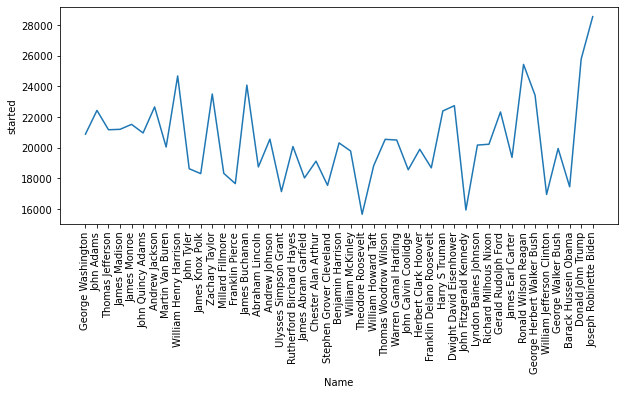

In [136]:
plt.figure(figsize=[10,4])
sns.lineplot(data=df3,x='name',y='days')
plt.xticks(rotation=90)
plt.xlabel('Name')
plt.ylabel('started');

In [141]:
display(df3.nlargest(2,'days'))

,name,birth_date,term_begin_date,days
44,Joseph Robinette Biden,1942-11-20,2021-01-20,28551.0
43,Donald John Trump,1946-06-14,2017-01-20,25788.0


Joseph Robinette Biden is the oldest president of US

In [140]:
display(df3.nsmallest(2,'days'))

,name,birth_date,term_begin_date,days
24,Theodore Roosevelt,1858-10-27,1901-09-14,15662.0
33,John Fitzgerald Kennedy,1917-05-29,1961-01-20,15942.0


Theodore Roosevelt was the youngest president of US